I am assuming `Tenure` is the day. 

In [5]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 8))

df_test = pd.read_csv('data/customer_churn_dataset-testing-master.csv')

# df.columns = ['id', 'age', 'gender', 'tenure', 'frequency', 'calls', 'delay', 'subscription', 'contractlength', 'spend', 'lastinteraction', 'churn']
df_test.dtypes

# non_numberic_ages = df.age.str.contains('[^0-9.-]')
# df.loc[non_numberic_ages].head()
# set(df.age[non_numberic_ages])
df_test.head()

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,1,22,Female,25,14,4,27,Basic,Monthly,598,9,1
1,2,41,Female,28,28,7,13,Standard,Monthly,584,20,0
2,3,47,Male,27,10,2,29,Premium,Annual,757,21,0
3,4,35,Male,9,12,5,17,Premium,Quarterly,232,18,0
4,5,53,Female,58,24,9,2,Standard,Annual,533,18,0


<Figure size 1000x800 with 0 Axes>

In [6]:
df_train = pd.read_csv('data/customer_churn_dataset-training-master.csv')
df_train

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,2.0,30.0,Female,39.0,14.0,5.0,18.0,Standard,Annual,932.00,17.0,1.0
1,3.0,65.0,Female,49.0,1.0,10.0,8.0,Basic,Monthly,557.00,6.0,1.0
2,4.0,55.0,Female,14.0,4.0,6.0,18.0,Basic,Quarterly,185.00,3.0,1.0
3,5.0,58.0,Male,38.0,21.0,7.0,7.0,Standard,Monthly,396.00,29.0,1.0
4,6.0,23.0,Male,32.0,20.0,5.0,8.0,Basic,Monthly,617.00,20.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
440828,449995.0,42.0,Male,54.0,15.0,1.0,3.0,Premium,Annual,716.38,8.0,0.0
440829,449996.0,25.0,Female,8.0,13.0,1.0,20.0,Premium,Annual,745.38,2.0,0.0
440830,449997.0,26.0,Male,35.0,27.0,1.0,5.0,Standard,Quarterly,977.31,9.0,0.0
440831,449998.0,28.0,Male,55.0,14.0,2.0,0.0,Standard,Quarterly,602.55,2.0,0.0


In [4]:
rows, col = df_train.shape
print('There are {} rows and {} columns in the training set.'.format(rows, col))

There are 440833 rows and 12 columns in the training set.


In [4]:
df_train["Last Interaction"].max()

30.0

In [13]:
# lets look at the data types of each column
df_train.dtypes


CustomerID           float64
Age                  float64
Gender                object
Tenure               float64
Usage Frequency      float64
Support Calls        float64
Payment Delay        float64
Subscription Type     object
Contract Length       object
Total Spend          float64
Last Interaction     float64
Churn                float64
dtype: object

In [23]:
# Are there any null values?
df_train.isnull().sum()

CustomerID           1
Age                  1
Gender               1
Tenure               1
Usage Frequency      1
Support Calls        1
Payment Delay        1
Subscription Type    1
Contract Length      1
Total Spend          1
Last Interaction     1
Churn                1
dtype: int64

In [7]:
# show the null values in the dataset
df_train[df_train.isnull().any(axis=1)].head()

# remove the rows with null values
df_train = df_train.dropna()

In [6]:
df_train['Churn'].value_counts()

1.0    249999
0.0    190833
Name: Churn, dtype: int64

In [17]:
# Lets check the churn rate in the training set
churn_rate = df_train['Churn'].value_counts() / rows
print('The churn rate is {:.2%}'.format(churn_rate[1]))

The churn rate is 56.71%


Okay from the observation 56.71% Churn rate is very high. Lets investigate the cause of this.

In [19]:
# lets find the correlation between the features
corr = df_train.corr()
corr

,CustomerID,Age,Tenure,Usage Frequency,Support Calls,Payment Delay,Total Spend,Last Interaction,Churn
CustomerID,1.000000,-0.181977,0.044129,0.038455,-0.482894,-0.262029,0.359289,-0.125356,-0.839365
Age,-0.181977,1.000000,-0.011630,-0.007190,0.158451,0.061738,-0.084684,0.028980,0.218394
Tenure,0.044129,-0.011630,1.000000,-0.026800,-0.027640,-0.016588,0.019006,-0.006903,-0.051919
Usage Frequency,0.038455,-0.007190,-0.026800,1.000000,-0.022013,-0.014470,0.018631,-0.004662,-0.046101
Support Calls,-0.482894,0.158451,-0.027640,-0.022013,1.000000,0.162889,-0.221594,0.077684,0.574267
Payment Delay,-0.262029,0.061738,-0.016588,-0.014470,0.162889,1.000000,-0.121044,0.042708,0.312129
Total Spend,0.359289,-0.084684,0.019006,0.018631,-0.221594,-0.121044,1.000000,-0.056890,-0.429355
Last Interaction,-0.125356,0.028980,-0.006903,-0.004662,0.077684,0.042708,-0.056890,1.000000,0.149616
Churn,-0.839365,0.218394,-0.051919,-0.046101,0.574267,0.312129,-0.429355,0.149616,1.000000


In [22]:
# explanatory variables
explanatory_var = corr['Churn'].sort_values(ascending=False).head(10).to_frame()
explanatory_var

,Churn
Churn,1.000000
Support Calls,0.574267
Payment Delay,0.312129
Age,0.218394
Last Interaction,0.149616
Usage Frequency,-0.046101
Tenure,-0.051919
Total Spend,-0.429355
CustomerID,-0.839365


Expalin the above computed correlations:



<AxesSubplot:>

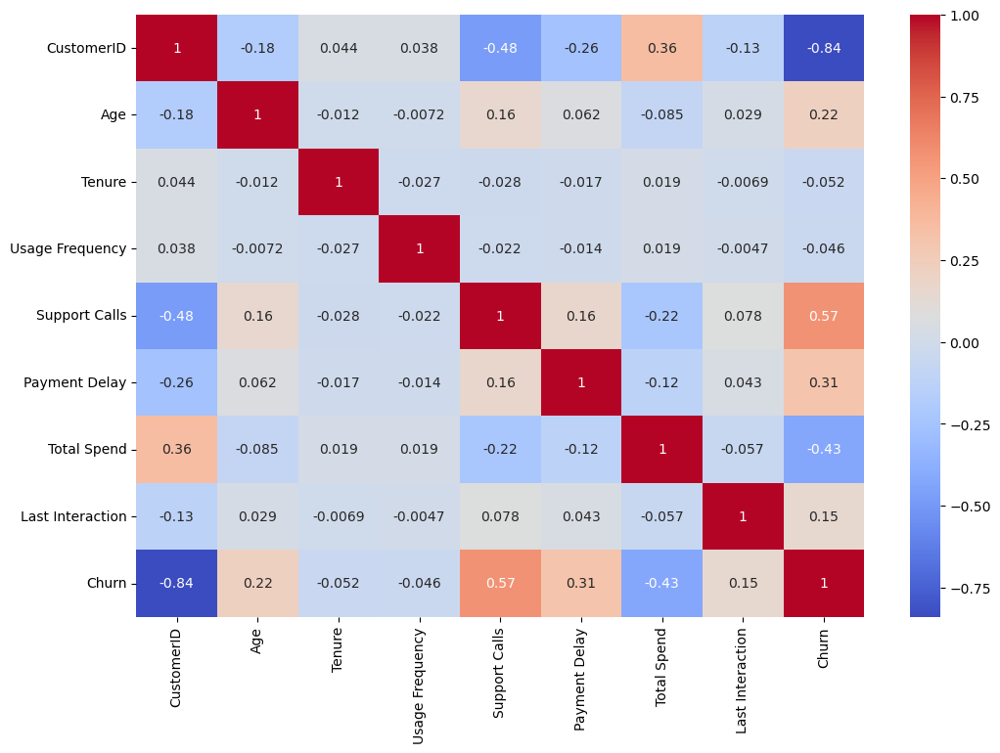

In [21]:
# lets plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm')


In [7]:
# select rows whos churn is yes
churn_df = df_train[df_train['Churn'] == 1.0]
churn_df.shape

(249999, 12)

In [8]:
churn_df["Gender"].value_counts()

Female    127058
Male      122941
Name: Gender, dtype: int64

Out of churned cutomers, its observed geder distribution is balanced.

<AxesSubplot:>

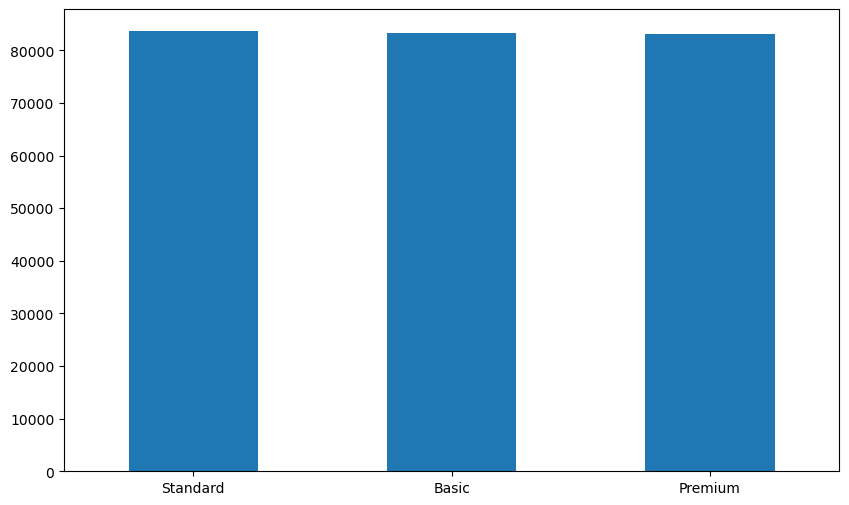

In [43]:
churn_df["Subscription Type"].value_counts().plot(kind='bar', figsize=(10, 6), rot=0)

<AxesSubplot:title={'center':'Contract Length'}>

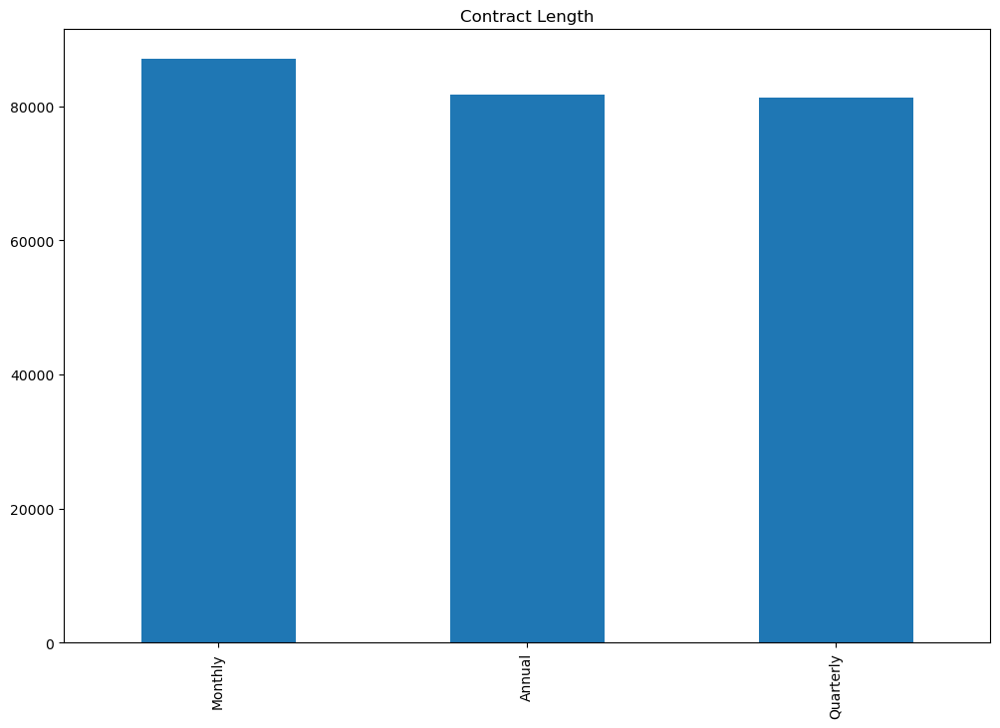

In [42]:
churn_df["Contract Length"].value_counts().plot(kind='bar', figsize=(12, 8), title='Contract Length')

<AxesSubplot:title={'center':'Age of Churned Customers'}>

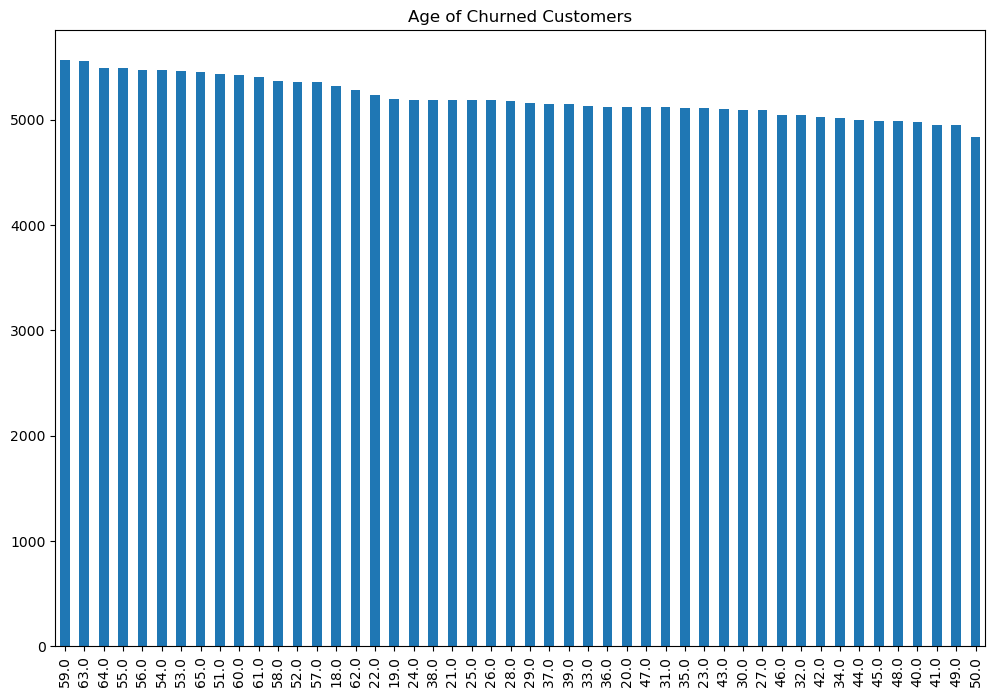

In [44]:
churn_df["Age"].value_counts().plot(kind='bar', figsize=(12, 8), title='Age of Churned Customers')

<AxesSubplot:title={'center':'Subscription Type and Contract Length'}, xlabel='Subscription Type,Contract Length'>

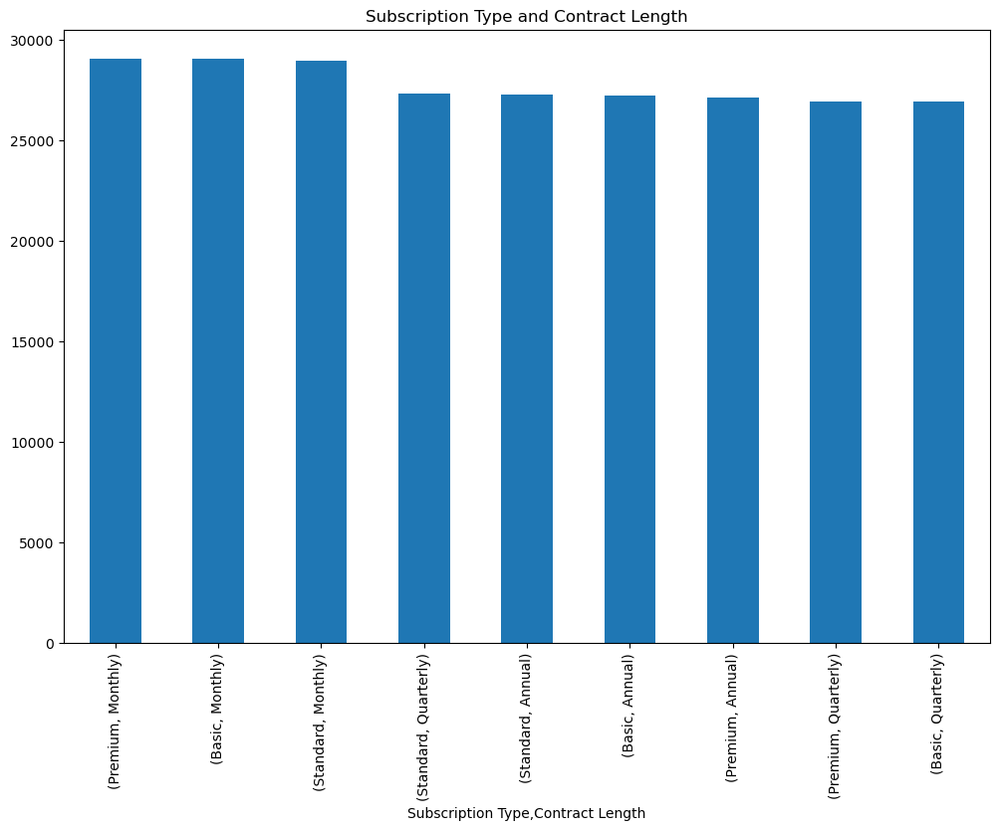

In [46]:
churn_df[["Subscription Type", "Contract Length"]].value_counts().plot(kind='bar', figsize=(12, 8), title='Subscription Type and Contract Length')

Analyse same thing with unchurned data

<AxesSubplot:title={'center':'Churn Rate by Subscription Type'}, xlabel='Subscription Type'>

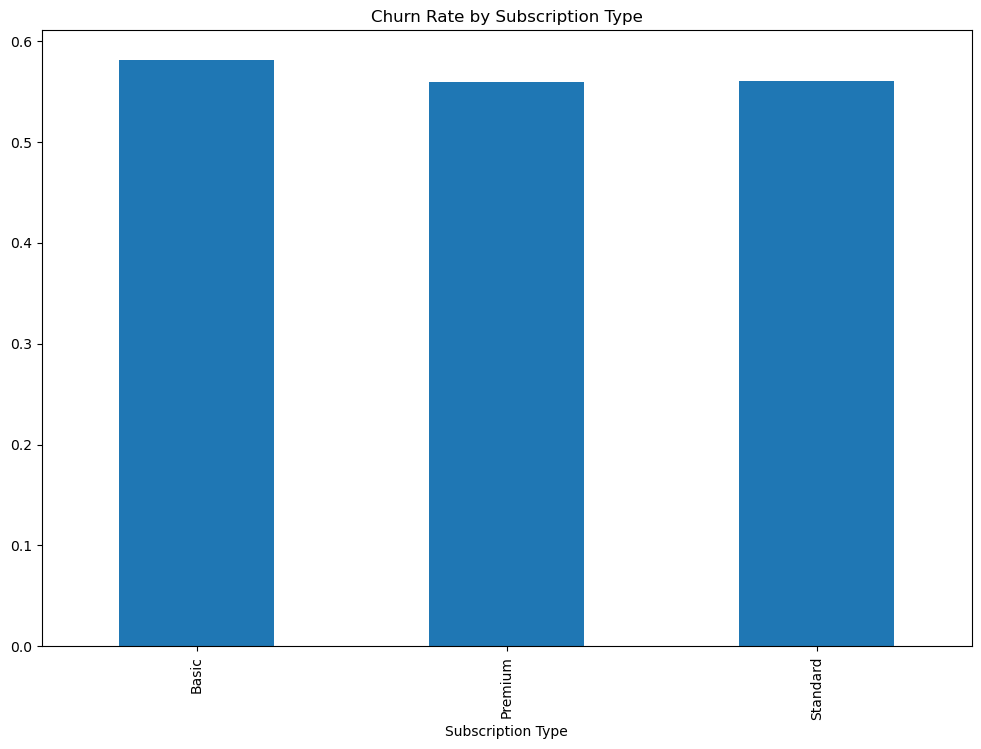

In [53]:
# we have two dataframes, one for the churned customers and one for the customers who have not churned
# I want to see if there is a difference in the average age of the two groups
# and if there is a difference in the average spend of the two groups
# I will use a t-test to see if there is a significant difference between the two groups
# I will use a p-value of 0.05 as the threshold for significance

# lets import the t-test function
from scipy.stats import ttest_ind

# lets create a dataframe for the customers who have not churned
not_churn = df_train[df_train['Churn'] == 0.0]

# lets run the t-test for the age of the two groups
ttest_ind(churn_df['Age'], not_churn['Age'])

# lets run the t-test for the spend of the two groups
ttest_ind(churn_df['Total Spend'], not_churn['Total Spend'])

# lets look at the churn rate for the different subscription types
df_train.groupby(['Subscription Type'])['Churn'].mean().plot(kind='bar', figsize=(12, 8), title='Churn Rate by Subscription Type')

# lets look at the churn rate for the different contract lengths
# df_train.groupby(['Contract Length'])['Churn'].mean().plot(kind='bar', figsize=(12, 8), title='Churn Rate by Contract Length')





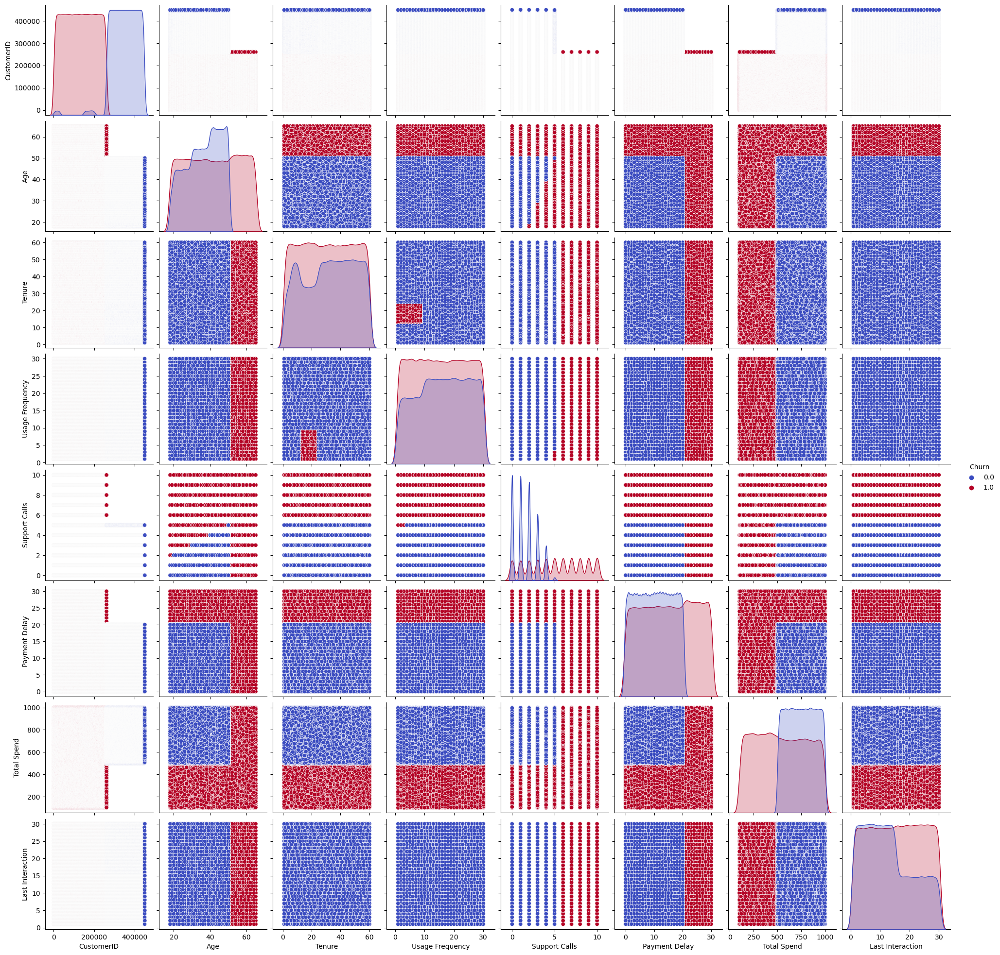

In [55]:
# draw a pairplot of the variables we are interested in and the churn variable to see if there is any correlation between them
sns.pairplot(df_train, hue='Churn', palette='coolwarm')

In [57]:
# Label encoding for 'Gender' column
df_train['Gender'] = df_train['Gender'].astype('category').cat.codes

df_train

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,2.0,30.0,0,39.0,14.0,5.0,18.0,Standard,Annual,932.00,17.0,1.0
1,3.0,65.0,0,49.0,1.0,10.0,8.0,Basic,Monthly,557.00,6.0,1.0
2,4.0,55.0,0,14.0,4.0,6.0,18.0,Basic,Quarterly,185.00,3.0,1.0
3,5.0,58.0,1,38.0,21.0,7.0,7.0,Standard,Monthly,396.00,29.0,1.0
4,6.0,23.0,1,32.0,20.0,5.0,8.0,Basic,Monthly,617.00,20.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
440828,449995.0,42.0,1,54.0,15.0,1.0,3.0,Premium,Annual,716.38,8.0,0.0
440829,449996.0,25.0,0,8.0,13.0,1.0,20.0,Premium,Annual,745.38,2.0,0.0
440830,449997.0,26.0,1,35.0,27.0,1.0,5.0,Standard,Quarterly,977.31,9.0,0.0
440831,449998.0,28.0,1,55.0,14.0,2.0,0.0,Standard,Quarterly,602.55,2.0,0.0


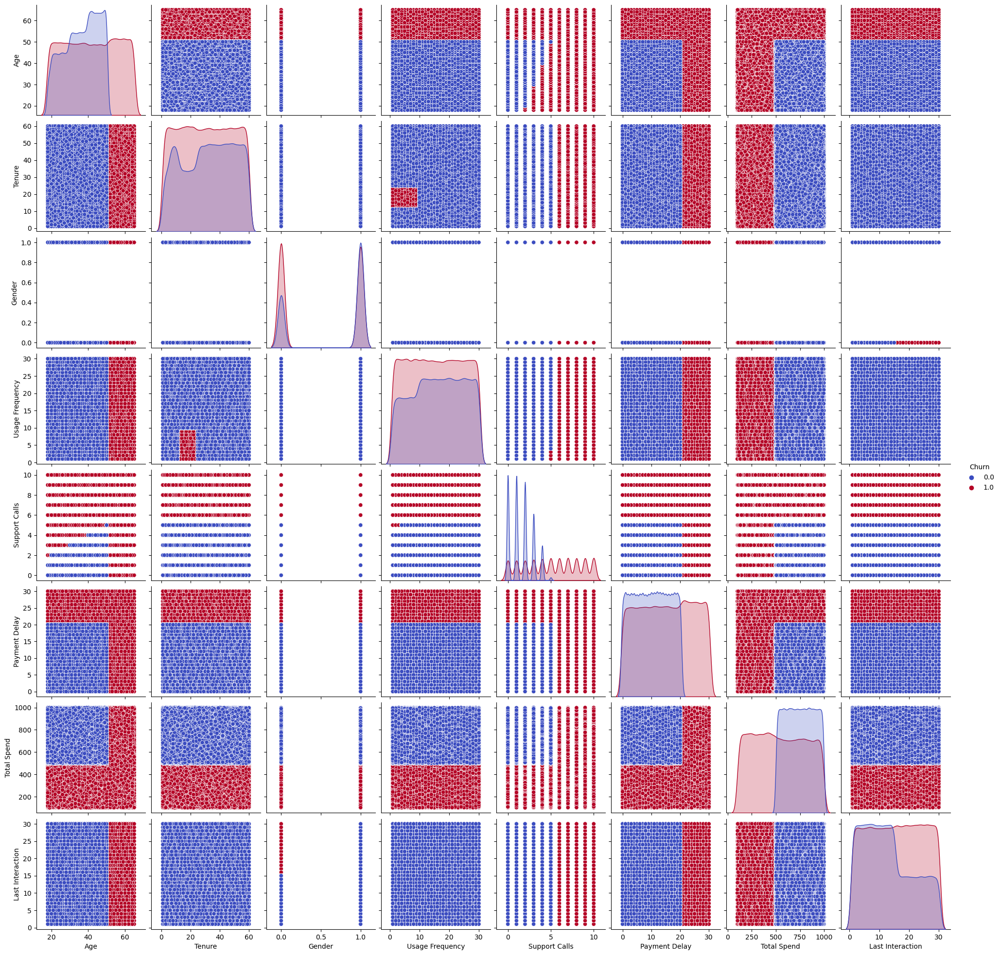

In [64]:
# draw a pairplot of the variables we are interested in and the churn variable to see if there is any correlation between them
sns.pairplot(df_train[["Age", "Tenure", "Gender", "Usage Frequency", "Support Calls", "Payment Delay", "Total Spend", "Last Interaction", "Churn"]], hue='Churn', palette='coolwarm')

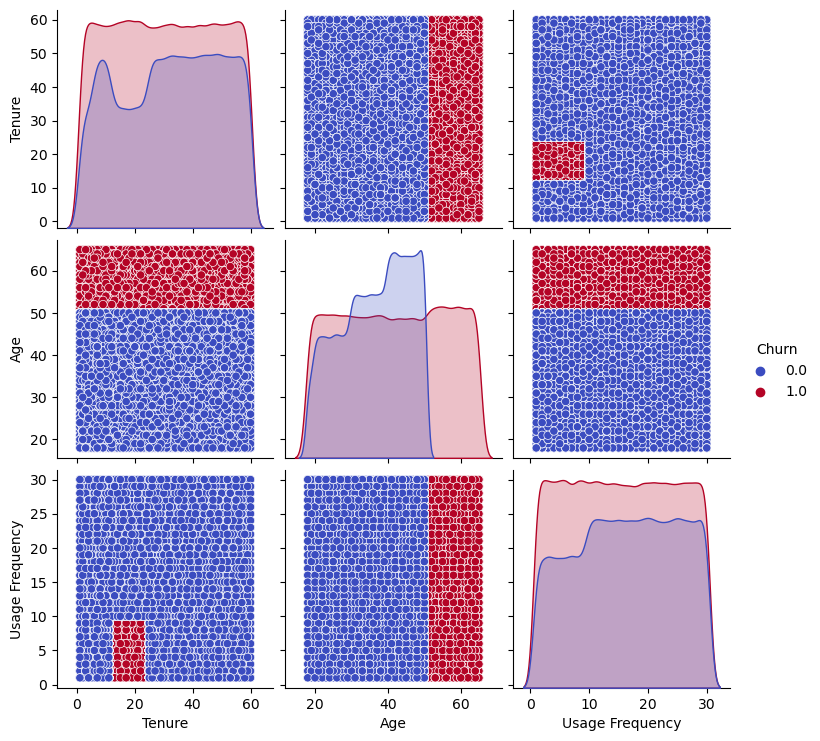

In [66]:
# investigate the churn rate for the different subscription types

sns.pairplot(df_train[["Tenure", "Age", "Usage Frequency", "Churn"]], hue='Churn', palette='coolwarm')

Observation: churn rate is high of folks who's age is greater than 50, 

- Age > 50
- Usage Frequency > 11


<AxesSubplot:xlabel='Age', ylabel='Count'>

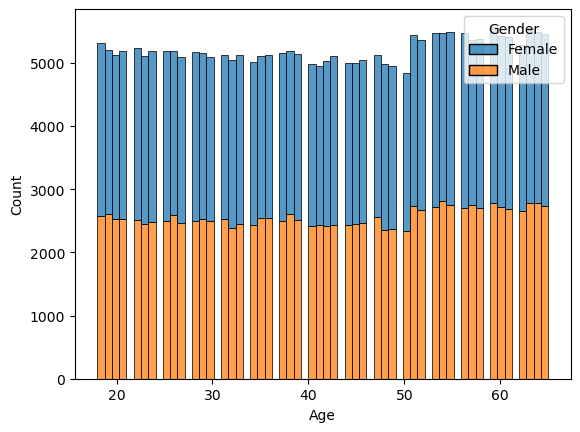

In [13]:
# Create a histogram plot of age churn using Seaborn
sns.histplot(data=churn_df, x='Age', hue='Gender', multiple='stack')

<AxesSubplot:xlabel='Tenure', ylabel='Usage Frequency'>

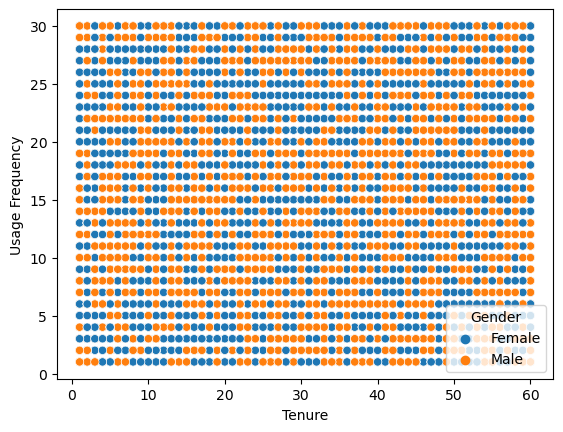

In [26]:
# Create a histogram plot of Usage Frequency churn using Seaborn
sns.scatterplot(data=churn_df, x="Tenure", y='Usage Frequency', hue='Gender')

<AxesSubplot:xlabel='Age', ylabel='Usage Frequency'>

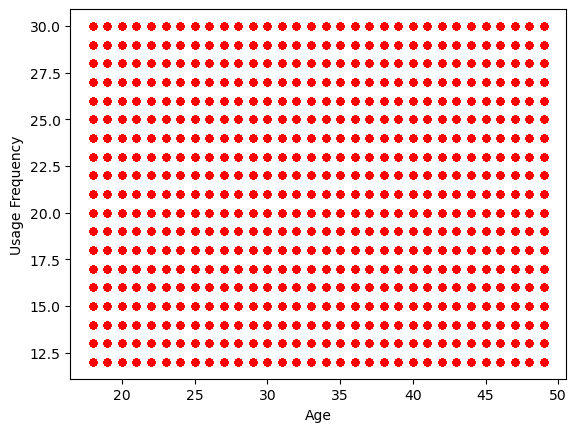

In [10]:
churn_df[(churn_df["Age"] < 50) & (churn_df["Usage Frequency"] > 11)]

<AxesSubplot:xlabel='Tenure', ylabel='Usage Frequency'>

/home/asimzahid/anaconda3/envs/SUSHI/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


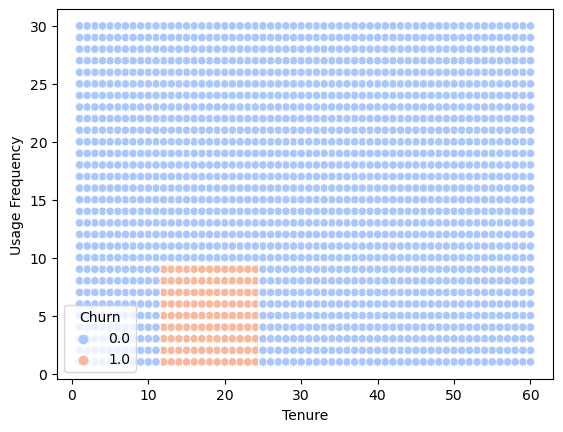

In [27]:
# Create a scatter plot of Tenure and Usage Frequency columns
sns.scatterplot(data=df_train, x='Tenure', y='Usage Frequency', hue='Churn', palette='coolwarm')

### Key Takeaway
Here I

<AxesSubplot:xlabel='Tenure', ylabel='Usage Frequency'>

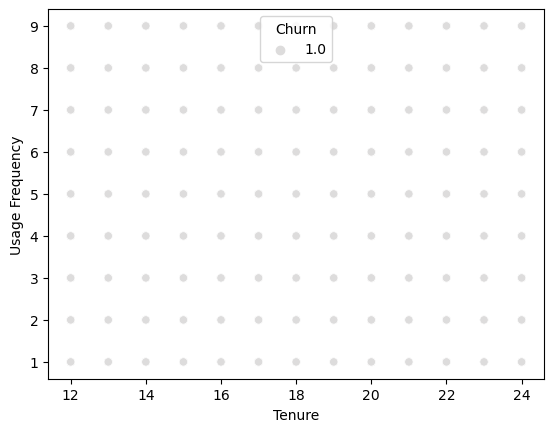

In [44]:
churned_data = df_train[(df_train["Usage Frequency"] < 10) & (df_train["Tenure"] > 11) & (df_train["Tenure"] < 25)]

# plot churned data in seaborn plot
sns.scatterplot(data=churned_data, x='Tenure', y='Usage Frequency', hue='Churn', palette='coolwarm')


In [30]:
churned_data.shape

(17141, 12)

<AxesSubplot:xlabel='Tenure', ylabel='Usage Frequency'>

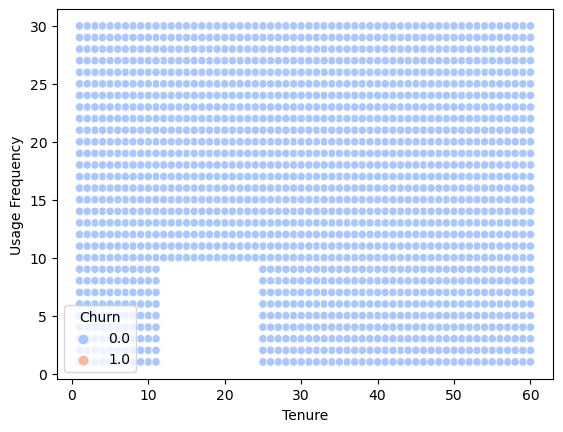

In [41]:
unchurned_data = df_train[(df_train["Usage Frequency"] >= 10) | (df_train["Tenure"] <= 11) | (df_train["Tenure"] >= 25)]

# plot churned data in seaborn plot
sns.scatterplot(data=unchurned_data, x='Tenure', y='Usage Frequency', hue='Churn', palette='coolwarm')

<AxesSubplot:xlabel='Subscription Type,Contract Length'>

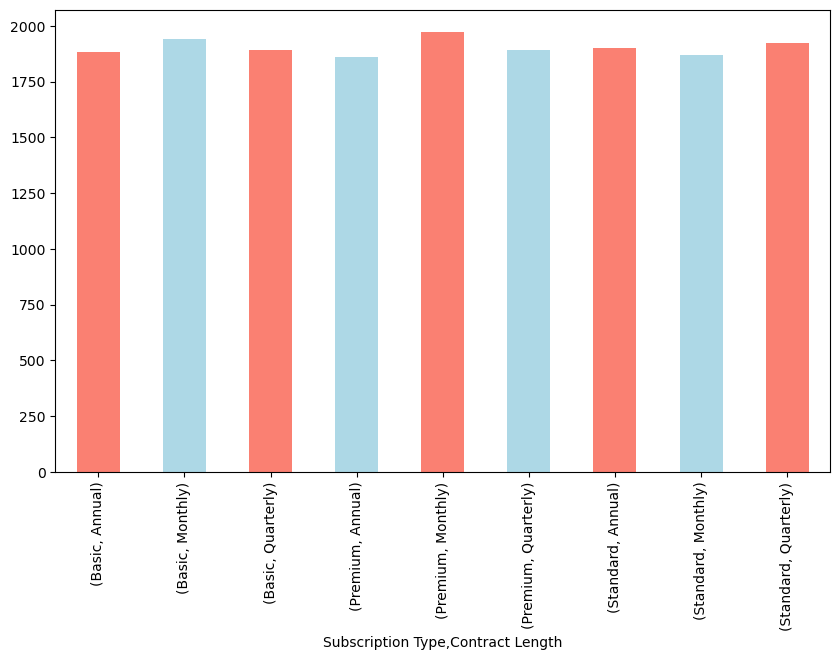

In [63]:
churned_data[["Subscription Type", "Contract Length"]].value_counts().sort_index().plot(kind="bar", figsize=(10,6), color=["salmon", "lightblue"])

In [58]:
unchurned_data.head()

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,2.0,30.0,Female,39.0,14.0,5.0,18.0,Standard,Annual,932.0,17.0,1.0
1,3.0,65.0,Female,49.0,1.0,10.0,8.0,Basic,Monthly,557.0,6.0,1.0
3,5.0,58.0,Male,38.0,21.0,7.0,7.0,Standard,Monthly,396.0,29.0,1.0
4,6.0,23.0,Male,32.0,20.0,5.0,8.0,Basic,Monthly,617.0,20.0,1.0
5,8.0,51.0,Male,33.0,25.0,9.0,26.0,Premium,Annual,129.0,8.0,1.0


<AxesSubplot:>

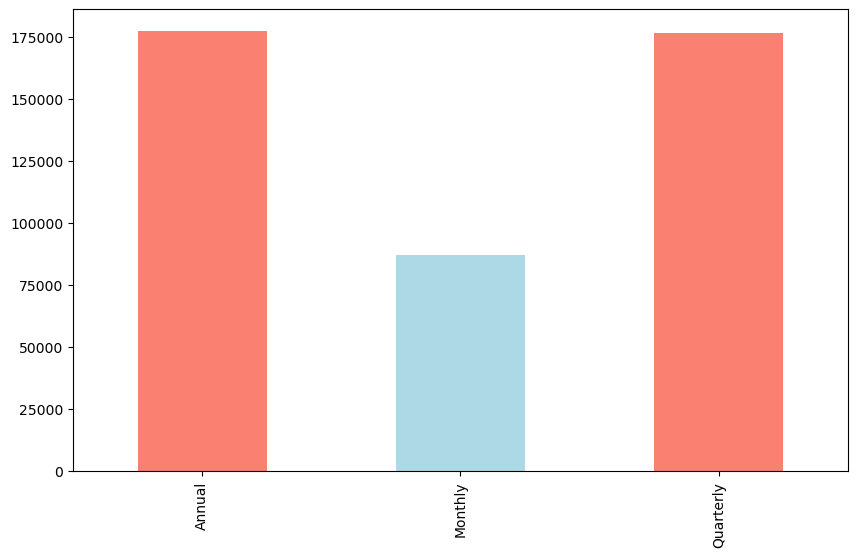

In [61]:
df_train["Contract Length"].value_counts().sort_index().plot(kind="bar", figsize=(10,6), color=["salmon", "lightblue"])

<AxesSubplot:xlabel='Tenure', ylabel='Usage Frequency'>

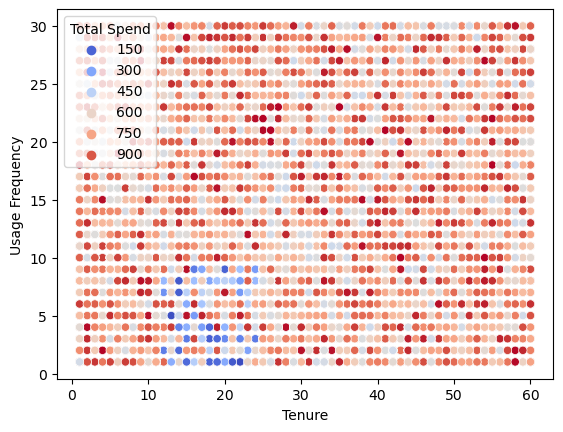

In [64]:
### Take Away: Something spent (less than 450 )| 150, 300, 450
# Check chrun with total spend

# Create a scatter plot of Tenure and Usage Frequency columns
sns.scatterplot(data=df_train, x='Tenure', y='Usage Frequency', hue='Total Spend', palette='coolwarm')

<AxesSubplot:xlabel='Tenure', ylabel='Usage Frequency'>

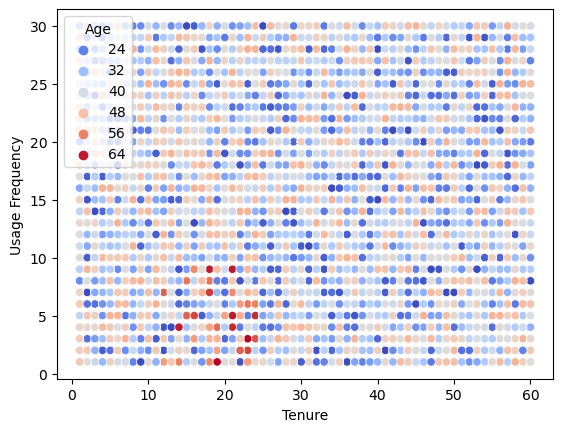

In [65]:
### Take Away: Not useful
# Check chrun with Age

# Create a scatter plot of Tenure and Usage Frequency columns
sns.scatterplot(data=df_train, x='Tenure', y='Usage Frequency', hue='Age', palette='coolwarm')

<AxesSubplot:xlabel='Tenure', ylabel='Usage Frequency'>

/home/asimzahid/anaconda3/envs/SUSHI/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


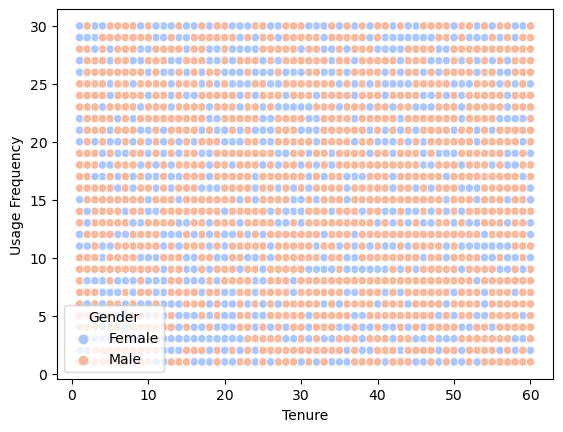

In [66]:
### Take Away: Not useful
# Check chrun with Gender

# Create a scatter plot of Tenure and Usage Frequency columns
sns.scatterplot(data=df_train, x='Tenure', y='Usage Frequency', hue='Gender', palette='coolwarm')

<AxesSubplot:xlabel='Tenure', ylabel='Usage Frequency'>

/home/asimzahid/anaconda3/envs/SUSHI/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


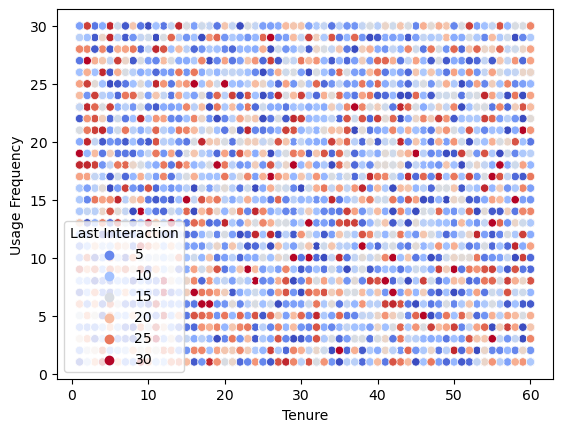

In [67]:
### Take Away: 
# Check chrun with Last Interaction

# Create a scatter plot of Tenure and Usage Frequency columns
sns.scatterplot(data=df_train, x='Tenure', y='Usage Frequency', hue='Last Interaction', palette='coolwarm')

<AxesSubplot:xlabel='Tenure', ylabel='Support Calls'>

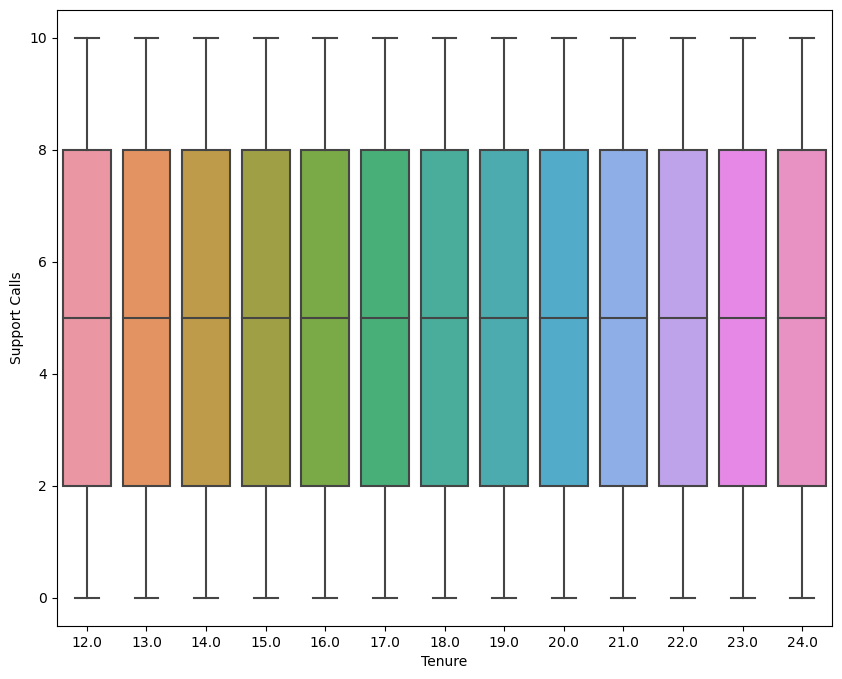

In [78]:
plt.figure(figsize=(10, 8))
# draw seaborn box plot to analyze total spend
sns.violinplot(x = 'Tenure', y = 'Support Calls', data = churned_data)

<AxesSubplot:xlabel='Tenure', ylabel='Support Calls'>

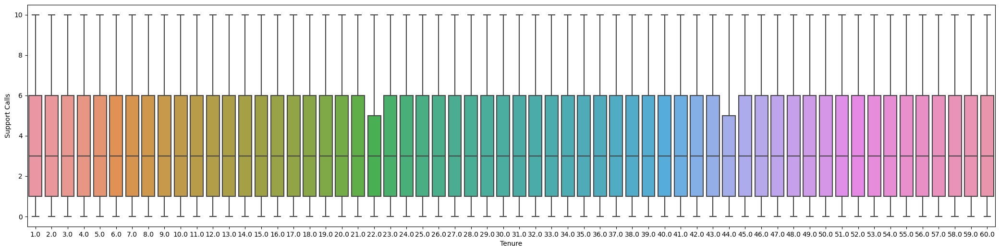

In [84]:
plt.figure(figsize=(26, 6))
# draw seaborn box plot to analyze total spend
sns.violinplot(x = 'Tenure', y = 'Support Calls', data = unchurned_data)

Text(-0.7163055555555555, 0.5, 'Density')

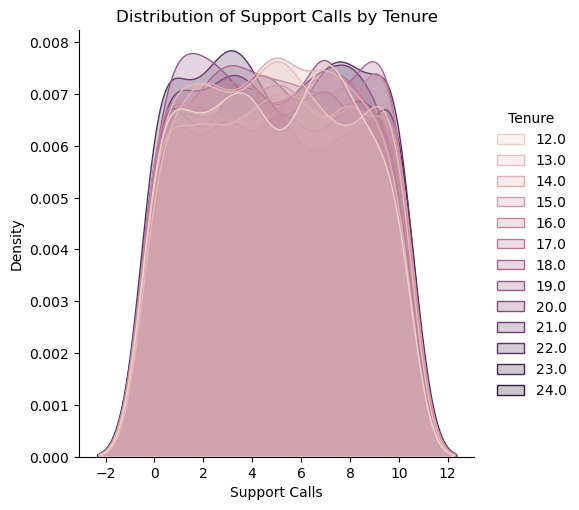

In [91]:
# Create a normal distribution plot of Support Calls for each Tenure group
sns.displot(data=churned_data, x='Support Calls', hue='Tenure', kind='kde', fill=True)

# Set plot title and axis labels
plt.title('Distribution of Support Calls by Tenure')
plt.xlabel('Support Calls')
plt.ylabel('Density')

# Test dataframe

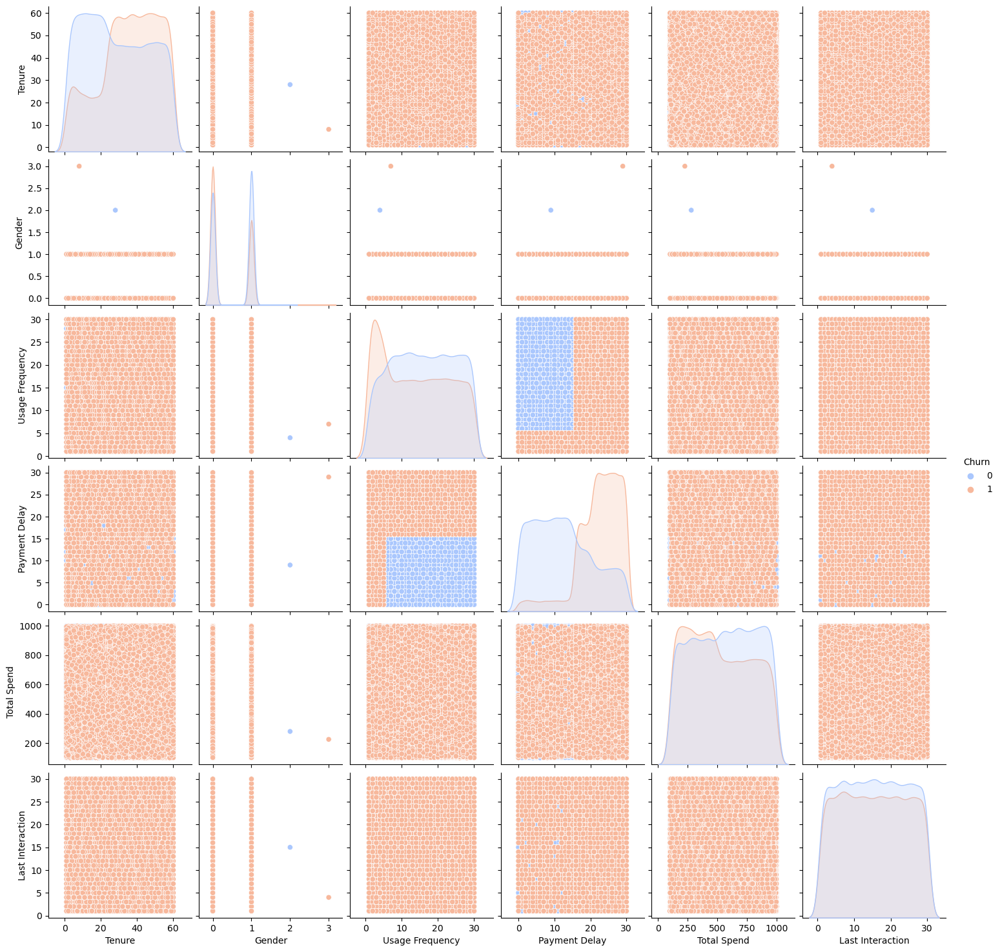

In [93]:
# Label encoding for 'Gender' column
df_test['Gender'] = df_test['Gender'].astype('category').cat.codes
# draw a pairplot of the variables we are interested in and the churn variable to see if there is any correlation between them
sns.pairplot(df_test[["Age", "Tenure", "Gender", "Usage Frequency", "Support Calls", "Payment Delay", "Total Spend", "Last Interaction", "Churn"]], hue='Churn', palette='coolwarm')

In [95]:
df_test

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,1,22,0,25,14,4,27,Basic,Monthly,598,9,1
1,2,41,0,28,28,7,13,Standard,Monthly,584,20,0
2,3,47,1,27,10,2,29,Premium,Annual,757,21,0
3,4,35,1,9,12,5,17,Premium,Quarterly,232,18,0
4,5,53,0,58,24,9,2,Standard,Annual,533,18,0
...,...,...,...,...,...,...,...,...,...,...,...,...
64369,64370,45,0,33,12,6,21,Basic,Quarterly,947,14,1
64370,64371,37,1,6,1,5,22,Standard,Annual,923,9,1
64371,64372,25,1,39,14,8,30,Premium,Monthly,327,20,1
64372,64373,50,0,18,19,7,22,Standard,Monthly,540,13,1


In [97]:
df_test.describe()

,CustomerID,Gender,Tenure,Usage Frequency,Payment Delay,Total Spend,Last Interaction,Churn
count,64374.000000,64374.000000,64374.000000,64374.000000,64374.000000,64374.000000,64374.000000,64374.000000
mean,32187.500000,0.466415,31.994827,15.080234,17.133952,541.023379,15.498850,0.473685
std,18583.317451,0.498999,17.098234,8.816470,8.852211,260.874809,8.638436,0.499311
min,1.000000,0.000000,1.000000,1.000000,0.000000,100.000000,1.000000,0.000000
25%,16094.250000,0.000000,18.000000,7.000000,10.000000,313.000000,8.000000,0.000000
50%,32187.500000,0.000000,33.000000,15.000000,19.000000,534.000000,15.000000,0.000000
75%,48280.750000,1.000000,47.000000,23.000000,25.000000,768.000000,23.000000,1.000000
max,64374.000000,3.000000,60.000000,30.000000,30.000000,1000.000000,30.000000,1.000000


In [98]:
df_train.describe()

,CustomerID,Age,Tenure,Usage Frequency,Support Calls,Payment Delay,Total Spend,Last Interaction,Churn
count,440832.000000,440832.000000,440832.000000,440832.000000,440832.000000,440832.000000,440832.000000,440832.000000,440832.000000
mean,225398.667955,39.373153,31.256336,15.807494,3.604437,12.965722,631.616223,14.480868,0.567107
std,129531.918550,12.442369,17.255727,8.586242,3.070218,8.258063,240.803001,8.596208,0.495477
min,2.000000,18.000000,1.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000
25%,113621.750000,29.000000,16.000000,9.000000,1.000000,6.000000,480.000000,7.000000,0.000000
50%,226125.500000,39.000000,32.000000,16.000000,3.000000,12.000000,661.000000,14.000000,1.000000
75%,337739.250000,48.000000,46.000000,23.000000,6.000000,19.000000,830.000000,22.000000,1.000000
max,449999.000000,65.000000,60.000000,30.000000,10.000000,30.000000,1000.000000,30.000000,1.000000


<AxesSubplot:xlabel='Tenure', ylabel='Usage Frequency'>

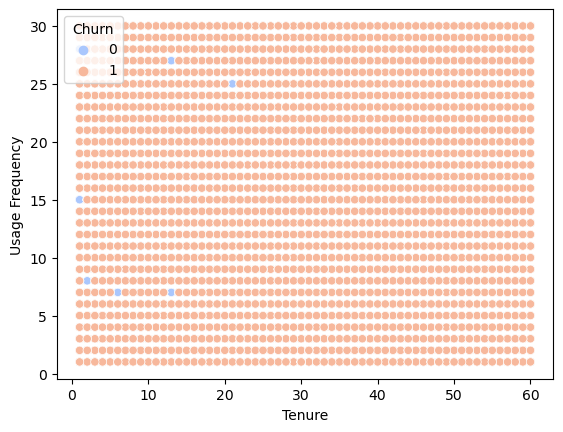

In [6]:
test_unchurned_data = df_test[(df_test["Usage Frequency"] >= 10) | (df_test["Tenure"] <= 11) | (df_test["Tenure"] >= 25)]

# plot churned data in seaborn plot
sns.scatterplot(data=df_test, x='Tenure', y='Usage Frequency', hue='Churn', palette='coolwarm')

In [7]:
df_test["Churn"].value_counts()

0    33881
1    30493
Name: Churn, dtype: int64

<AxesSubplot:xlabel='Payment Delay', ylabel='Usage Frequency'>

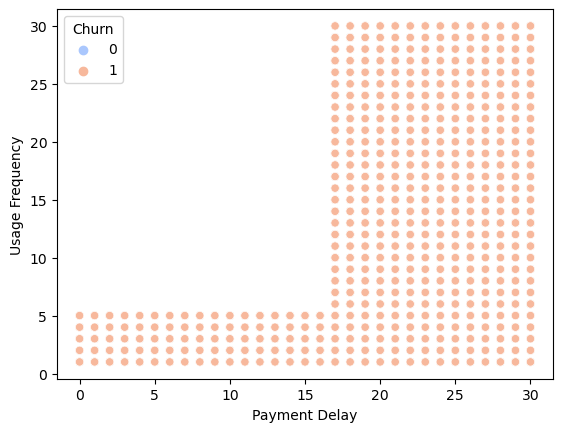

In [17]:
test_churned_data = df_test[(df_test["Payment Delay"] > 16) | (df_test["Usage Frequency"] <= 5) ]

# plot churned data in seaborn plot
sns.scatterplot(data=test_churned_data, x='Payment Delay', y='Usage Frequency', hue='Churn', palette='coolwarm')

## Cohort Analysis

In [9]:
df_train['Last Interaction'] = df_train['Last Interaction'].astype(int)

<ipython-input-9-99026752ba6c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['Last Interaction'] = df_train['Last Interaction'].astype(int)


In [13]:
df_train

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn,cohort
0,2.0,30.0,Female,39.0,14.0,5.0,18.0,Standard,Annual,932.00,17,1.0,17
1,3.0,65.0,Female,49.0,1.0,10.0,8.0,Basic,Monthly,557.00,6,1.0,6
2,4.0,55.0,Female,14.0,4.0,6.0,18.0,Basic,Quarterly,185.00,3,1.0,3
3,5.0,58.0,Male,38.0,21.0,7.0,7.0,Standard,Monthly,396.00,29,1.0,29
4,6.0,23.0,Male,32.0,20.0,5.0,8.0,Basic,Monthly,617.00,20,1.0,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...
440828,449995.0,42.0,Male,54.0,15.0,1.0,3.0,Premium,Annual,716.38,8,0.0,8
440829,449996.0,25.0,Female,8.0,13.0,1.0,20.0,Premium,Annual,745.38,2,0.0,2
440830,449997.0,26.0,Male,35.0,27.0,1.0,5.0,Standard,Quarterly,977.31,9,0.0,9
440831,449998.0,28.0,Male,55.0,14.0,2.0,0.0,Standard,Quarterly,602.55,2,0.0,2


<ipython-input-14-948c04b08240>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['cohort'] = df_train['Last Interaction'] # .apply(lambda x: x[:7])


Text(0, 0.5, 'Number of Customers')

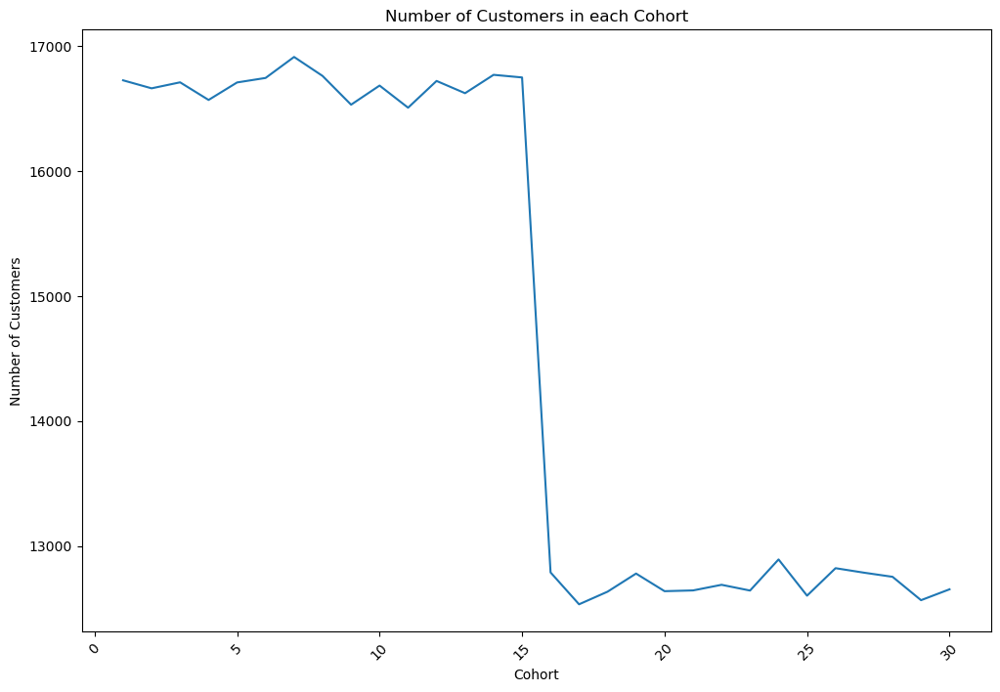

In [14]:
# perform cohort analysis
# create a new column called cohort
df_train['cohort'] = df_train['Last Interaction'] # .apply(lambda x: x[:7])
# df_train.head()

# create a pivot table to show the number of customers in each cohort
cohort_df = df_train.groupby('cohort')['CustomerID'].nunique().reset_index()

# seaborn plot the number of customers in each cohort
plt.figure(figsize=(12, 8))
sns.lineplot(data=cohort_df, x='cohort', y='CustomerID')
plt.xticks(rotation=45)
plt.title('Number of Customers in each Cohort')
plt.xlabel('Cohort')
plt.ylabel('Number of Customers')



In [7]:

# Convert Tenure column from days to dates
df_train['Tenure_date'] = pd.to_datetime(df_train['Tenure'], unit='D', origin=pd.Timestamp('2021-01-01'))

# Extract month and year from Tenure column
df_train['Tenure Month'] = df_train['Tenure_date'].dt.strftime('%Y-%m')

# Print the first 5 rows of the DataFrame
print(df_train.head())

/home/asimzahid/anaconda3/envs/SUSHI/lib/python3.8/site-packages/pandas/core/tools/datetimes.py:528: RuntimeWarning: invalid value encountered in cast
  arr, tz_parsed = tslib.array_with_unit_to_datetime(arg, unit, errors=errors)


   CustomerID   Age  Gender  Tenure  Usage Frequency  Support Calls  \
0         2.0  30.0  Female    39.0             14.0            5.0   
1         3.0  65.0  Female    49.0              1.0           10.0   
2         4.0  55.0  Female    14.0              4.0            6.0   
3         5.0  58.0    Male    38.0             21.0            7.0   
4         6.0  23.0    Male    32.0             20.0            5.0   

   Payment Delay Subscription Type Contract Length  Total Spend  \
0           18.0          Standard          Annual        932.0   
1            8.0             Basic         Monthly        557.0   
2           18.0             Basic       Quarterly        185.0   
3            7.0          Standard         Monthly        396.0   
4            8.0             Basic         Monthly        617.0   

   Last Interaction  Churn Tenure_date Tenure Month  
0              17.0    1.0  2021-02-09      2021-02  
1               6.0    1.0  2021-02-19      2021-02  
2       

In [16]:
df_train.dtypes

CustomerID                  float64
Age                         float64
Gender                       object
Tenure                      float64
Usage Frequency             float64
Support Calls               float64
Payment Delay               float64
Subscription Type            object
Contract Length              object
Total Spend                 float64
Last Interaction            float64
Churn                       float64
Tenure_date          datetime64[ns]
Tenure Month                 object
dtype: object

In [21]:
df_train.head()

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn,Tenure_date,Tenure Month
0,2.0,30.0,Female,39.0,14.0,5.0,18.0,Standard,Annual,932.0,17.0,1.0,2021-02-09,2021-02
1,3.0,65.0,Female,49.0,1.0,10.0,8.0,Basic,Monthly,557.0,6.0,1.0,2021-02-19,2021-02
2,4.0,55.0,Female,14.0,4.0,6.0,18.0,Basic,Quarterly,185.0,3.0,1.0,2021-01-15,2021-01
3,5.0,58.0,Male,38.0,21.0,7.0,7.0,Standard,Monthly,396.0,29.0,1.0,2021-02-08,2021-02
4,6.0,23.0,Male,32.0,20.0,5.0,8.0,Basic,Monthly,617.0,20.0,1.0,2021-02-02,2021-02


In [18]:
train_cohort = (df_train[['CustomerID', 'Tenure_date']]
                 .assign(cohort = lambda x: x['Tenure_date'].dt.to_period('M'))
                 .sort_values('Tenure_date')
                 .drop_duplicates('CustomerID')
                 .reset_index()
                 .loc[:, ['CustomerID', 'cohort']]
                )
train_cohort.head(3)

,CustomerID,cohort
0,237757.0,2021-01
1,230422.0,2021-01
2,217044.0,2021-01


In [ ]:
from operator import attrgetter

cohort_df = (
  pd.merge(df_train, train_cohort, on='CustomerID')
  .assign(date_of_sale = lambda x: x['Tenure_date'].dt.to_period('M'),
          delta = lambda x: (x.date_of_sale - x.cohort).apply(attrgetter('n')))
  .loc[:, ['CustomerID', 'date', 'cohort', 'date_of_sale', 'delta']]
  )

cohort_df.head(3)